In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import datetime, gc, random
import json, numpy as np, pandas as pd, zipfile
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.cluster import MeanShift, estimate_bandwidth
# file
import zipfile


# Data preprocessing
import datetime
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

# Visualization
from matplotlib import pyplot as plt
import folium
import seaborn as sns
sns.set_theme(style="ticks", color_codes=True)
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from colorama import Fore

# Random forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

# parameter opimization
from sklearn.model_selection import GridSearchCV

# Validation
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# file
import zipfile

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/train.csv.zip
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/metaData_taxistandsID_name_GPSlocation.csv.zip
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/sampleSubmission.csv.zip
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/evaluation_script.r
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/test.csv.zip
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/train.csv.zip
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/metaData_taxistandsID_name_GPSlocation.csv.zip
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/sampleSubmission.csv.zip
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/evaluation_script.r
/kaggle/input/pkdd-15-taxi-trip-time-prediction-ii/test.csv.zip


CPU times: user 35 ms, sys: 6.78 ms, total: 41.7 ms
Wall time: 43.1 ms


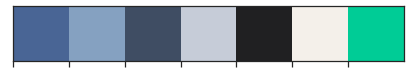

In [2]:
%%time
# Defining all our palette colours.
primary_blue = "#496595"
primary_blue2 = "#85a1c1"
primary_blue3 = "#3f4d63"
primary_grey = "#c6ccd8"
primary_black = "#202022"
primary_bgcolor = "#f4f0ea"

primary_green = px.colors.qualitative.Plotly[2]

plt.rcParams['axes.facecolor'] = primary_bgcolor

colors = [primary_blue, primary_blue2, primary_blue3, primary_grey, primary_black, primary_bgcolor, primary_green]
sns.palplot(sns.color_palette(colors))

# 1. Loading the Data

In [3]:
%%time
# Reading The Data

# sample
zip_file = zipfile.ZipFile("../input/pkdd-15-taxi-trip-time-prediction-ii/sampleSubmission.csv.zip")

sample = pd.read_csv(zip_file.open('sampleSubmission.csv'))

# train
zip_file = zipfile.ZipFile("../input/pkdd-15-taxi-trip-time-prediction-ii/train.csv.zip")
train = pd.read_csv(zip_file.open("train.csv"))

# test
zip_file = zipfile.ZipFile("../input/pkdd-15-taxi-trip-time-prediction-ii/test.csv.zip")
test = pd.read_csv(zip_file.open("test.csv"))

# location_Data
zip_file = zipfile.ZipFile("../input/pkdd-15-taxi-trip-time-prediction-ii/metaData_taxistandsID_name_GPSlocation.csv.zip")
location = pd.read_csv(zip_file.open("metaData_taxistandsID_name_GPSlocation.csv"))

CPU times: user 29.2 s, sys: 2.42 s, total: 31.7 s
Wall time: 42.5 s


In [4]:
%%time
sample

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.87 µs


,TRIP_ID,TRAVEL_TIME
0,T1,660
1,T2,660
2,T3,660
3,T4,660
4,T5,660
...,...,...
315,T323,660
316,T324,660
317,T325,660
318,T326,660


In [5]:
%%time
train

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 8.34 µs


,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,1372636858620000589,C,NaN,NaN,20000589,1372636858,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[..."
1,1372637303620000596,B,NaN,7.0,20000596,1372637303,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[..."
2,1372636951620000320,C,NaN,NaN,20000320,1372636951,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-..."
3,1372636854620000520,C,NaN,NaN,20000520,1372636854,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[..."
4,1372637091620000337,C,NaN,NaN,20000337,1372637091,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-..."
...,...,...,...,...,...,...,...,...,...
1710665,1404171463620000698,C,NaN,NaN,20000698,1404171463,A,False,"[[-8.612469,41.14602],[-8.612487,41.145993],[-..."
1710666,1404171367620000670,C,NaN,NaN,20000670,1404171367,A,False,"[[-8.610138,41.140845],[-8.610174,41.140935],[..."
1710667,1388745716620000264,C,NaN,NaN,20000264,1388745716,A,False,[]
1710668,1404141826620000248,B,NaN,12.0,20000248,1404141826,A,False,"[[-8.630712,41.154885],[-8.63073,41.154813],[-..."


In [6]:
%%time
test

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 7.39 µs


,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,T1,B,NaN,15.0,20000542,1408039037,A,False,"[[-8.585676,41.148522],[-8.585712,41.148639],[..."
1,T2,B,NaN,57.0,20000108,1408038611,A,False,"[[-8.610876,41.14557],[-8.610858,41.145579],[-..."
2,T3,B,NaN,15.0,20000370,1408038568,A,False,"[[-8.585739,41.148558],[-8.58573,41.148828],[-..."
3,T4,B,NaN,53.0,20000492,1408039090,A,False,"[[-8.613963,41.141169],[-8.614125,41.141124],[..."
4,T5,B,NaN,18.0,20000621,1408039177,A,False,"[[-8.619903,41.148036],[-8.619894,41.148036]]"
...,...,...,...,...,...,...,...,...,...
315,T323,A,70885.0,NaN,20000430,1419171485,A,False,"[[-8.570196,41.159484],[-8.570187,41.158962],[..."
316,T324,B,NaN,53.0,20000020,1419170802,A,False,"[[-8.613873,41.141232],[-8.613882,41.141241],[..."
317,T325,C,NaN,NaN,20000207,1419172121,A,False,"[[-8.6481,41.152536],[-8.647461,41.15241],[-8...."
318,T326,A,76232.0,NaN,20000667,1419171980,A,False,"[[-8.571699,41.156073],[-8.570583,41.155929],[..."


In [7]:
%%time
location

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.63 µs


,ID,Descricao,Latitude,Longitude
0,1,Agra,41.1771457135,-8.609670
1,2,Alameda,41.15618964,-8.591064
2,3,Aldoar,41.1705249231,-8.665876
3,4,Alfândega,41.1437639911,-8.621803
4,5,Amial,41.1835097223,-8.612726
...,...,...,...,...
58,59,Tenente Valadim,41.1607030178,-8.641205
59,60,Trindade,41.1511237005,-8.609843
60,61,Vinte e Quatro de Agosto,41.1493101131,-8.600309
61,62,Viso,41.1778737602,-8.646558


# 2. Exploratory Data Analysis

In [8]:
%%time
# Time data preprocessing
train["TIMESTAMP"] = [float(time) for time in train["TIMESTAMP"]]
train["data_time"] = [datetime.datetime.fromtimestamp(time, datetime.timezone.utc) for time in train["TIMESTAMP"]]

CPU times: user 3.75 s, sys: 157 ms, total: 3.9 s
Wall time: 3.9 s


In [9]:
# Time data
train["data_time"].value_counts()

2014-03-27 19:31:22+00:00    5
2014-04-10 12:57:28+00:00    5
2014-03-27 18:49:12+00:00    5
2013-12-15 04:32:43+00:00    4
2014-05-10 04:54:38+00:00    4
                            ..
2014-01-24 19:44:48+00:00    1
2014-06-04 18:26:59+00:00    1
2013-11-12 11:03:19+00:00    1
2013-10-18 13:38:48+00:00    1
2013-07-13 05:50:26+00:00    1
Name: data_time, Length: 1655366, dtype: int64

In [10]:
%%time
# Time data preparation
train["year"] = train["data_time"].dt.year
train["month"] = train["data_time"].dt.month
train["day"] = train["data_time"].dt.day
train["hour"] = train["data_time"].dt.hour
train["min"] = train["data_time"].dt.minute
train["weekday"] = train["data_time"].dt.weekday

CPU times: user 970 ms, sys: 12.6 ms, total: 983 ms
Wall time: 981 ms


In [11]:
%%time
train.head()

CPU times: user 442 µs, sys: 0 ns, total: 442 µs
Wall time: 449 µs


,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,data_time,year,month,day,hour,min,weekday
0,1372636858620000589,C,NaN,NaN,20000589,1.372637e+09,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,2013,7,1,0,0,0
1,1372637303620000596,B,NaN,7.0,20000596,1.372637e+09,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,2013,7,1,0,8,0
2,1372636951620000320,C,NaN,NaN,20000320,1.372637e+09,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,2013,7,1,0,2,0
3,1372636854620000520,C,NaN,NaN,20000520,1.372637e+09,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,2013,7,1,0,0,0
4,1372637091620000337,C,NaN,NaN,20000337,1.372637e+09,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,2013,7,1,0,4,0


CPU times: user 187 ms, sys: 153 ms, total: 340 ms
Wall time: 354 ms


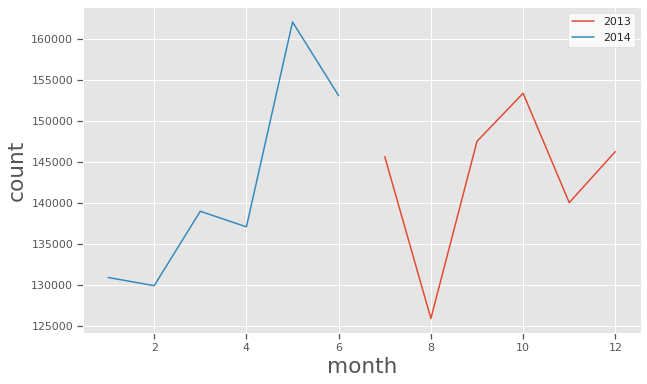

In [12]:
%%time
# Time series visualization
pivot = pd.pivot_table(train, index='month', columns="year", values="TRIP_ID", aggfunc="count").reset_index()

# Visualization, per month count
with plt.style.context("ggplot"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["month"], pivot[2013], label="2013")
    plt.plot(pivot["month"], pivot[2014], label="2014")
    plt.xlabel("month")
    plt.ylabel("count")
    plt.legend(facecolor="white")

CPU times: user 120 ms, sys: 44.7 ms, total: 164 ms
Wall time: 162 ms


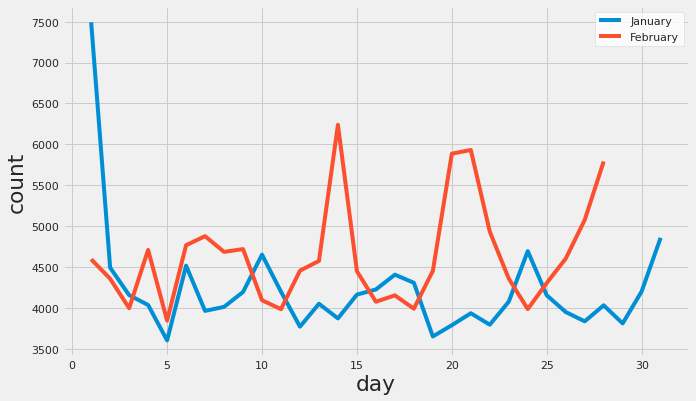

In [13]:
%%time
# Time series visualization
pivot = pd.pivot_table(train, index='day', columns="month", values="TRIP_ID", aggfunc="count").reset_index()
# Visualization, per day count
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["day"], pivot[1], label="January")
    plt.plot(pivot["day"], pivot[2], label="February")
    plt.xlabel("day")
    plt.ylabel("count")
    plt.legend(facecolor="white")

In [14]:
%%time
### Call type
fig = px.histogram(train, x='CALL_TYPE', color='CALL_TYPE', color_discrete_sequence=[primary_blue, primary_grey],)
fig.update_layout(
    title_text='Call Type Distribution', # title of plot
    xaxis_title_text='Call Type', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    paper_bgcolor=primary_bgcolor,
    plot_bgcolor=primary_bgcolor,
)
fig.show()

CPU times: user 16 s, sys: 808 ms, total: 16.9 s
Wall time: 17.4 s


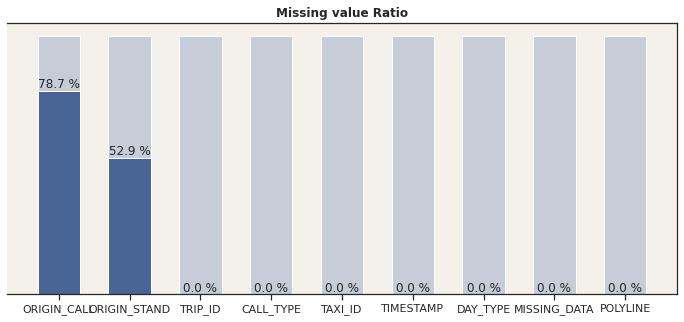

CPU times: user 931 ms, sys: 18.8 ms, total: 950 ms
Wall time: 945 ms


In [15]:
%%time
# Checking Missing Values
nan_data = (train.isna().sum().sort_values(ascending=False) / len(train) * 100)[:9]
fig, ax = plt.subplots(1,1,figsize=(12, 5))

ax.bar(nan_data.index, 100, color=primary_grey, width=0.6)

bar = ax.bar(
    nan_data.index, 
    nan_data, 
    color=primary_blue, 
    width=0.6
)
ax.bar_label(bar, fmt='%.01f %%')
ax.spines.left.set_visible(False)
ax.set_yticks([])
ax.set_title('Missing value Ratio', fontweight='bold')

plt.show()

In [16]:
%%time
### Control the number of trips read for training 
### Control the number of closest trips used to calculate trip duration
### Parameters for train set trips to keep and how much to pad travel time based on polyline
N_read = 5000
N_trips = 15
P_keep = 0.95
P_pad = 1.25

### Get Haversine distance
def get_dist(lonlat1, lonlat2):
  lon_diff = np.abs(lonlat1[0]-lonlat2[0])*np.pi/360.0
  lat_diff = np.abs(lonlat1[1]-lonlat2[1])*np.pi/360.0
  a = np.sin(lat_diff)**2 + np.cos(lonlat1[1]*np.pi/180.0) * np.cos(lonlat2[1]*np.pi/180.0) * np.sin(lon_diff)**2  
  d = 2*6371*np.arctan2(np.sqrt(a), np.sqrt(1-a))
  return(d)

### Read test

zip_file = zipfile.ZipFile("../input/pkdd-15-taxi-trip-time-prediction-ii/test.csv.zip")
test = pd.read_csv(zip_file.open("test.csv"), usecols=['POLYLINE', 'TRIP_ID'])
    
test['POLYLINE'] = test['POLYLINE'].apply(json.loads)
test['snapshots'] = test['POLYLINE'].apply(len)
test['lonlat'] = test['POLYLINE'].apply(lambda x: x[0])
test['lonlat_last'] = test['POLYLINE'].apply(lambda x: x[np.maximum(0,len(x)-1)])
vrajs5_time= test['POLYLINE'].apply(lambda x:(15.*len(x) / 0.7) if (len(x) > 25) else 660).values
test.drop('POLYLINE', axis=1, inplace=True)

### Read train

zip_file = zipfile.ZipFile("../input/pkdd-15-taxi-trip-time-prediction-ii/train.csv.zip")
train = pd.read_csv(zip_file.open("train.csv"), usecols=['POLYLINE'], nrows=N_read)


train['POLYLINE'] = train['POLYLINE'].apply(json.loads)
train['snapshots'] = train['POLYLINE'].apply(len)
train = train[train.snapshots>25]
train['lonlat'] = train['POLYLINE'].apply(lambda x: x[0])
train['lonlat_last'] = train['POLYLINE'].apply(lambda x: x[np.maximum(0,len(x)-1)])
train.drop('POLYLINE', axis=1, inplace=True)

test['TRAVEL_TIME'] = 0
for row, ll in enumerate(test['lonlat']):
    d = train['lonlat'].apply(lambda x: get_dist(x, ll))
    d2 = train['lonlat_last'].apply(lambda x: get_dist(x, test['lonlat_last'].values[row]))
    i = np.argpartition(d, N_trips)[0:N_trips]
    w = np.maximum(np.sqrt(d.iloc[i]*d2.iloc[i]), 0.01)
    s = train.iloc[i]['snapshots']
    j = np.argpartition(s, int(N_trips*P_keep))[0:int(N_trips*P_keep)]
    test.loc[row, 'TRAVEL_TIME'] = np.maximum(P_pad*test.loc[row, 'snapshots'], np.average(s.iloc[j], weights=1/w.iloc[j]))

### Blend with test average
test['TRAVEL_TIME'] = 15*(.5*test['TRAVEL_TIME']+.5*P_pad*np.maximum(test.snapshots.mean(), test['snapshots']))
test['TRAVEL_TIME'] = test['TRAVEL_TIME'].astype(int)
test[['TRIP_ID', 'TRAVEL_TIME']].to_csv('submission11.csv', index=False)

CPU times: user 1min 14s, sys: 28.5 ms, total: 1min 14s
Wall time: 1min 14s


In [17]:
%%time
sub = pd.read_csv("./submission11.csv")
sub.head(5)

CPU times: user 4.79 ms, sys: 683 µs, total: 5.48 ms
Wall time: 4.39 ms


,TRIP_ID,TRAVEL_TIME
0,T1,799
1,T2,797
2,T3,797
3,T4,700
4,T5,787
